In [ ]:
from google.colab import files
uploaded=files.upload()

Saving Employee-turnover.csv to Employee-turnover.csv


In [ ]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns



In [ ]:
df=pd.read_csv('Employee-turnover.csv')

In [ ]:
 pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     - 21.9 MB 143 kB/s
     |████████████████████████████████| 596 kB 4.9 MB/s 
     |████████████████████████████████| 102 kB 67.9 MB/s 
     |████████████████████████████████| 690 kB 58.5 MB/s 
     |████████████████████████████████| 4.7 MB 52.9 MB/s 
     |████████████████████████████████| 62 kB 1.2 MB/s 
     |████████████████████████████████| 812 kB 57.5 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=261257 sha256=59a4592b25bd9e7eaad7960d2e5f517c14f4b15fa061deed83794df13c15c98c
  Stored in directory: /tmp/pip-ephem-wheel-cache-e9cku6dq/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=b8554b3a6df640fcc3bc83c57f648cde3656b51bb5bec6e8c0924514f90ba570
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940

In [ ]:
# Data pre-processing and cleaning

In [ ]:
df['Attrition'] = df['Attrition (Yes/No)'].apply(lambda x: 0 if x=='No' else 1)

In [ ]:
df['Relationship Satisfaction'] = df['Relationship Satisfaction'].map({'Low': 0, 'Medium': 1, 'High': 2, 'Very High': 3})

In [ ]:
df['Work Life Balance'] = df['Work Life Balance'].map({'Bad': 0, 'Better': 1, 'Good': 2, 'Best': 3})

In [ ]:
df['Job Involvement'] = df['Job Involvement'].map({'Low': 0, 'Medium': 1, 'High': 2, 'Very High': 3})

In [ ]:
df['Job Satisfaction'] = df['Job Satisfaction'].map({'Low': 0, 'Medium': 1, 'High': 2, 'Very High': 3})


In [ ]:
df['Business Travel'] = df['Business Travel'].map({'Non-Travel': 0, 'Travel_Rarely': 1, 'Travel_Frequently': 2})


In [ ]:
df['Environment Satisfaction'] = df['Environment Satisfaction'].map({'Low': 0, 'Medium': 1, 'High': 2, 'Very High': 3})


In [ ]:
df['Marital Status'] = df['Marital Status'].map({'Single': 0, 'Married': 1, 'Divorced': 2})


In [ ]:
df

,Employee Count,Employee ID,Department,Job Role,Gender,Age,Marital Status,Education,Education Field,Business Travel,...,Years At Company,Years In Current Role,Years Since Last Promotion,Years With Curr Manager,Environment Satisfaction,Training Times Last Year,Work Life Balance,Relationship Satisfaction,Attrition (Yes/No),Attrition
0,1,1,Sales,Sales Executive,Female,41,0,College,Life Sciences,1,...,6,4,0,5,1,0,0,0,Yes,1
1,1,2,Research & Development,Research Scientist,Male,49,1,Below College,Life Sciences,2,...,10,7,1,7,2,3,1,3,No,0
2,1,4,Research & Development,Laboratory Technician,Male,37,0,College,Other,1,...,0,0,0,0,0,3,0,1,Yes,1
3,1,5,Research & Development,Research Scientist,Female,33,1,Master,Life Sciences,2,...,8,7,3,0,3,3,1,2,No,0
4,1,7,Research & Development,Laboratory Technician,Male,27,1,Below College,Medical,1,...,2,2,2,2,0,3,1,3,No,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,1,2061,Research & Development,Laboratory Technician,Male,36,1,College,Medical,2,...,5,2,0,3,2,3,1,2,No,0
1466,1,2062,Research & Development,Healthcare Representative,Male,39,1,Below College,Medical,1,...,7,7,1,7,3,5,1,0,No,0
1467,1,2064,Research & Development,Manufacturing Director,Male,27,1,Bachelor,Life Sciences,1,...,6,2,0,3,1,0,1,1,No,0
1468,1,2065,Sales,Sales Executive,Male,49,1,Bachelor,Medical,2,...,9,6,0,8,3,3,2,3,No,0


In [ ]:
feat_to_remove = ['Employee Count', 'Employee ID','Attrition (Yes/No)',]

df.drop( feat_to_remove , axis = 1, inplace = True )

In [ ]:
pf=ProfileReport(df)

In [ ]:
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# EDA

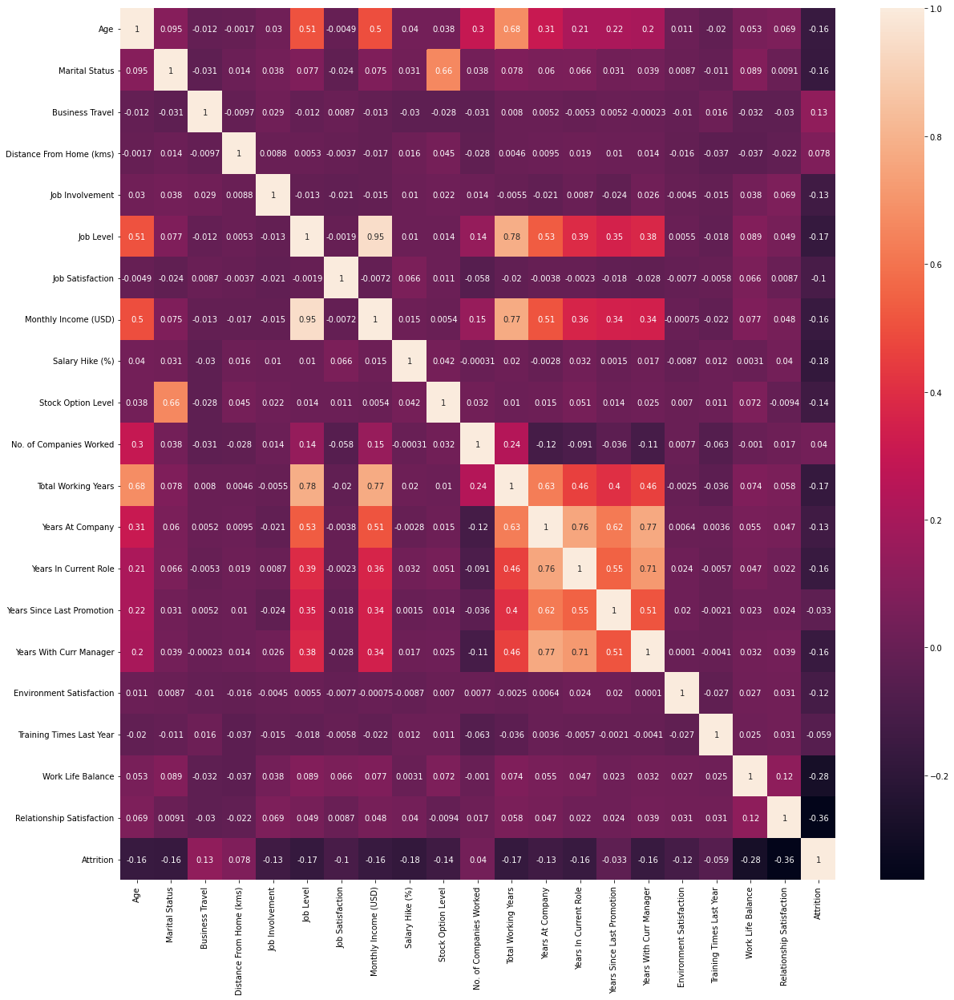

In [ ]:
correlations = df.corr()
plt.subplots(figsize = (20, 20))
sns.heatmap(correlations, annot = True)

with help of heatmap we can se there are no or very less multicollinearity amongst the irrelevent data attributes.This is a good sign for us as it help in training a model without much difficulty as, the model did not get any misleading correlation.

In [ ]:
# Now we will analyze each attributes with attrition on counterplot 

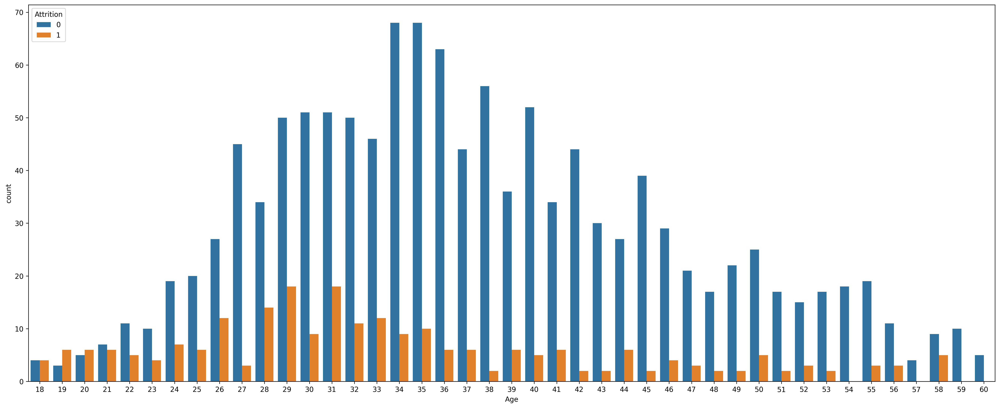

In [ ]:
plt.figure(figsize = (25, 10), dpi = 300)
sns.countplot(x='Age',hue="Attrition", data =df )

For age group below 22 we can observe that the attrition rate is high. We can conclude that young age groups have higher chances of leaving a company. 26-35 age group have the highest tendecy of leaving job too.




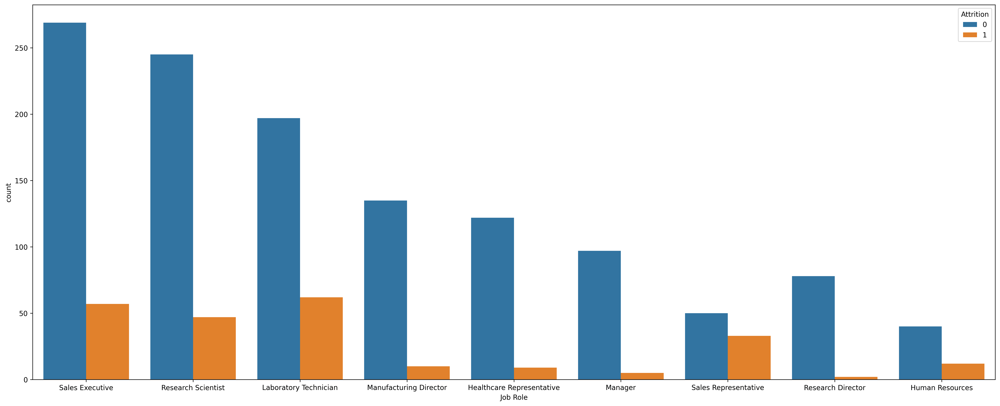

In [ ]:
plt.figure(figsize = (25, 10), dpi = 300)
sns.countplot(x = 'Job Role', hue = 'Attrition', data = df)

sales executive, research scientist, laboratory technician and sales representative job roles have higher number attrition, which makes these job role more vulnerable for future attrition. Especially for people between 26-35 years working under these job roles

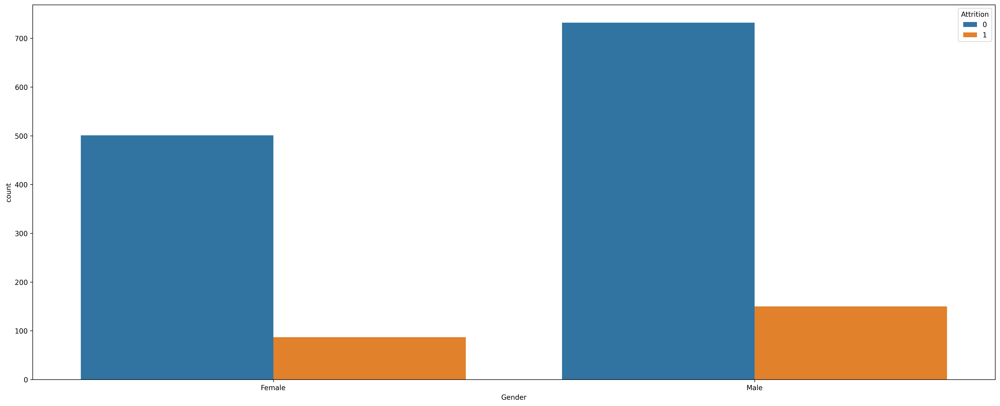

In [ ]:
plt.figure(figsize = (25, 10), dpi = 300)
sns.countplot(x = 'Gender', hue = 'Attrition', data = df)

Attrition is independent of gender

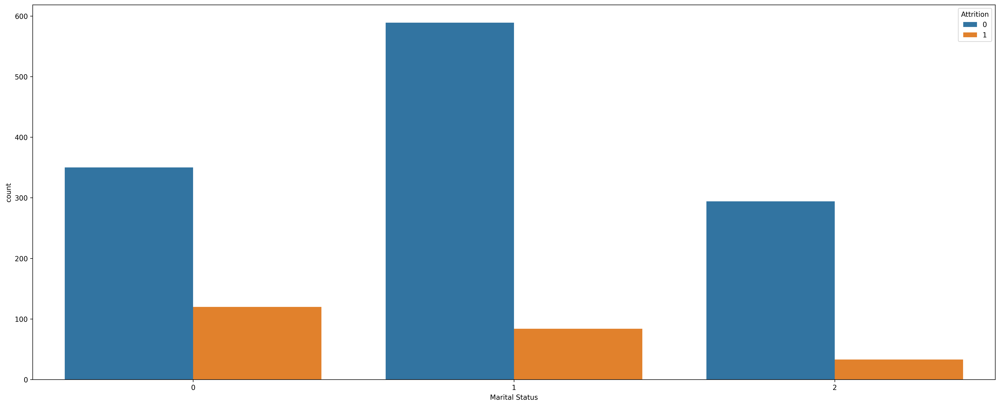

In [ ]:
plt.figure(figsize = (25, 10), dpi = 300)
sns.countplot(x = 'Marital Status', hue = 'Attrition', data = df)

Single people (mostly young) tend to leave the company more.

In [ ]:
left_df=df.loc[df['Attrition'] == 1]
stay_df=df.loc[df['Attrition'] == 0]

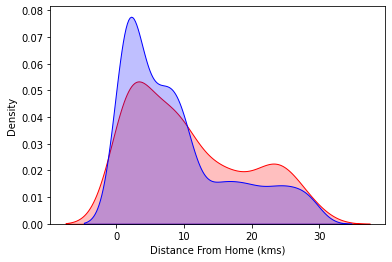

In [ ]:
sns.kdeplot(left_df['Distance From Home (kms)'], label = 'Employee left', shade = True, color = 'r' )
sns.kdeplot(stay_df['Distance From Home (kms)'], label = 'Employee stay', shade = True, color = 'b')


from 10 km onwards we can see that more employee tend to leave the company. therefore we can asssume that distance is an important parameter to decide whether an employee will stay or not

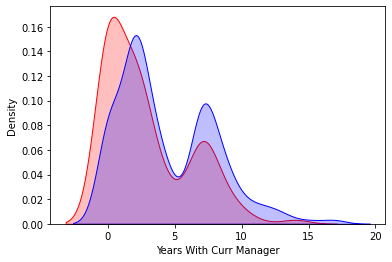

In [ ]:
sns.kdeplot(left_df['Years With Curr Manager'], label = 'Employee left', shade = True, color = 'r' )
sns.kdeplot(stay_df['Years With Curr Manager'], label = 'Employee stay', shade = True, color = 'b')


more employees tend to leave with less than 2 years with the current managers and tend to stay if having more than 5 years experience. this suggests that relationship with manager also plays an important role in deciding weather the employee will stay or not.

In [ ]:
# feature engineering


In [ ]:

print('Dataset dimension: {} rows, {} columns'.format(df.shape[0], df.shape[1]))

Dataset dimension: 1470 rows, 27 columns


In [ ]:
df

,Department,Job Role,Gender,Age,Marital Status,Education,Education Field,Business Travel,Distance From Home (kms),Job Involvement,...,Total Working Years,Years At Company,Years In Current Role,Years Since Last Promotion,Years With Curr Manager,Environment Satisfaction,Training Times Last Year,Work Life Balance,Relationship Satisfaction,Attrition
0,Sales,Sales Executive,Female,41,0,College,Life Sciences,1,1,2,...,8,6,4,0,5,1,0,0,0,1
1,Research & Development,Research Scientist,Male,49,1,Below College,Life Sciences,2,8,1,...,10,10,7,1,7,2,3,1,3,0
2,Research & Development,Laboratory Technician,Male,37,0,College,Other,1,2,1,...,7,0,0,0,0,0,3,0,1,1
3,Research & Development,Research Scientist,Female,33,1,Master,Life Sciences,2,3,2,...,8,8,7,3,0,3,3,1,2,0
4,Research & Development,Laboratory Technician,Male,27,1,Below College,Medical,1,2,2,...,6,2,2,2,2,0,3,1,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,Research & Development,Laboratory Technician,Male,36,1,College,Medical,2,23,3,...,17,5,2,0,3,2,3,1,2,0
1466,Research & Development,Healthcare Representative,Male,39,1,Below College,Medical,1,6,1,...,9,7,7,1,7,3,5,1,0,0
1467,Research & Development,Manufacturing Director,Male,27,1,Bachelor,Life Sciences,1,4,3,...,6,6,2,0,3,1,0,1,1,0
1468,Sales,Sales Executive,Male,49,1,Bachelor,Medical,2,2,1,...,17,9,6,0,8,3,3,2,3,0


In [ ]:
feat_to_remove = ['Gender', 'Education','Education Field','Department']

df.drop( feat_to_remove , axis = 1, inplace = True )

In [ ]:
df.head()


,Job Role,Age,Marital Status,Business Travel,Distance From Home (kms),Job Involvement,Job Level,Job Satisfaction,Monthly Income (USD),Salary Hike (%),...,Total Working Years,Years At Company,Years In Current Role,Years Since Last Promotion,Years With Curr Manager,Environment Satisfaction,Training Times Last Year,Work Life Balance,Relationship Satisfaction,Attrition
0,Sales Executive,41,0,1,1,2,2,3,5993,11,...,8,6,4,0,5,1,0,0,0,1
1,Research Scientist,49,1,2,8,1,2,1,5130,23,...,10,10,7,1,7,2,3,1,3,0
2,Laboratory Technician,37,0,1,2,1,1,2,2090,15,...,7,0,0,0,0,0,3,0,1,1
3,Research Scientist,33,1,2,3,2,1,2,2909,11,...,8,8,7,3,0,3,3,1,2,0
4,Laboratory Technician,27,1,1,2,2,1,1,3468,12,...,6,2,2,2,2,0,3,1,3,0


In [ ]:
print('Dataset dimension: {} rows, {} columns'.format(df.shape[0], df.shape[1]))

Dataset dimension: 1470 rows, 23 columns


In [ ]:
df['Over Time'] = df['Over Time'].map({'No': 0, 'Yes': 1})

In [ ]:
df['Job Role'] = df['Job Role'].map({'Laboratory Technician': 1, 'Research Scientist': 2, 'Sales Executive': 3,'Sales Representative': 4, 'Manufacturing Director': 0,'Healthcare Representative':0,'Manager':0,'Human Resources':0,'Research Director':0})

In [ ]:
df.head()

,Job Role,Age,Marital Status,Business Travel,Distance From Home (kms),Job Involvement,Job Level,Job Satisfaction,Monthly Income (USD),Salary Hike (%),...,Total Working Years,Years At Company,Years In Current Role,Years Since Last Promotion,Years With Curr Manager,Environment Satisfaction,Training Times Last Year,Work Life Balance,Relationship Satisfaction,Attrition
0,3,41,0,1,1,2,2,3,5993,11,...,8,6,4,0,5,1,0,0,0,1
1,2,49,1,2,8,1,2,1,5130,23,...,10,10,7,1,7,2,3,1,3,0
2,1,37,0,1,2,1,1,2,2090,15,...,7,0,0,0,0,0,3,0,1,1
3,2,33,1,2,3,2,1,2,2909,11,...,8,8,7,3,0,3,3,1,2,0
4,1,27,1,1,2,2,1,1,3468,12,...,6,2,2,2,2,0,3,1,3,0


In [ ]:
# Modelling

In [ ]:
df.to_csv("processed table.csv")

In [ ]:
dataset = pd.read_csv("processed table.csv")
dataset = pd.DataFrame(dataset)
y = dataset["Attrition"]
X = dataset.drop("Attrition",axis=1)

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=4)
X_train.head()

,Unnamed: 0,Job Role,Age,Marital Status,Business Travel,Distance From Home (kms),Job Involvement,Job Level,Job Satisfaction,Monthly Income (USD),...,No. of Companies Worked,Total Working Years,Years At Company,Years In Current Role,Years Since Last Promotion,Years With Curr Manager,Environment Satisfaction,Training Times Last Year,Work Life Balance,Relationship Satisfaction
1316,1316,3,43,1,2,2,2,2,3,5675,...,1,7,7,7,7,7,0,5,1,2
909,909,2,19,0,1,25,3,1,3,2994,...,1,1,1,0,0,1,1,2,1,3
1453,1453,3,36,1,1,11,1,2,3,6652,...,4,8,6,3,0,0,1,2,2,0
1358,1358,3,31,2,1,10,2,2,3,6583,...,2,8,5,2,1,4,2,2,1,3
157,157,2,58,1,1,9,1,1,1,3346,...,4,9,1,0,0,0,1,3,2,1


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm

In [ ]:
lr=LogisticRegression(C = 0.1, random_state = 42, solver = 'liblinear')
dt=DecisionTreeClassifier()
rm=RandomForestClassifier()
gnb=GaussianNB()
knn = KNeighborsClassifier(n_neighbors=3)
svm = svm.SVC(kernel='linear')

In [ ]:
for a,b in zip([lr,dt,knn,svm,rm,gnb],["Logistic Regression","Decision Tree","KNN","SVM","Random Forest","Naive Bayes"]):
    a.fit(X_train,y_train)
    prediction=a.predict(X_train)
    y_pred=a.predict(X_test)
    score1=accuracy_score(y_train,prediction)
    score=accuracy_score(y_test,y_pred)
    msg1="[%s] training data accuracy is : %f" % (b,score1)
    msg2="[%s] test data accuracy is : %f" % (b,score)
    print(msg1)
    print(msg2)

[Logistic Regression] training data accuracy is : 0.902211
[Logistic Regression] test data accuracy is : 0.935374
[Decision Tree] training data accuracy is : 1.000000
[Decision Tree] test data accuracy is : 0.857143
[KNN] training data accuracy is : 0.865646
[KNN] test data accuracy is : 0.809524
[SVM] training data accuracy is : 0.897109
[SVM] test data accuracy is : 0.925170
[Random Forest] training data accuracy is : 1.000000
[Random Forest] test data accuracy is : 0.931973
[Naive Bayes] training data accuracy is : 0.863095
[Naive Bayes] test data accuracy is : 0.863946
